In [36]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import altair as alt
import kaleido
import plotly.io as pio

In [37]:
# Read the data
df = pd.read_csv("../data/train_final.csv")
df.head()

,DATE,TYPE,STATE,CAUSE,TITLE,CATEGORY,DESCRIPTION,CASKLDRR,CASINJRR,CARSDMG,...,NARR8,NARR9,NARR10,NARR11,NARR12,NARR13,NARR14,NARR15,Latitude,Longitud
0,1975-01-01,Derailment,IL,T314,"Rack, Roadbed and Structures","Frogs, Switches and Track Appliances",Switch point worn or broken,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1975-01-04,Derailment,OH,T314,"Rack, Roadbed and Structures","Frogs, Switches and Track Appliances",Switch point worn or broken,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1975-01-05,Derailment,IA,T314,"Rack, Roadbed and Structures","Frogs, Switches and Track Appliances",Switch point worn or broken,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1975-01-13,Derailment,IA,T314,"Rack, Roadbed and Structures","Frogs, Switches and Track Appliances",Switch point worn or broken,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1975-01-14,Derailment,NY,T314,"Rack, Roadbed and Structures","Frogs, Switches and Track Appliances",Switch point worn or broken,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:

# create a dictionary mapping state to region
state_to_region = {'AL': 'South', 'AK': 'West', 'AZ': 'West', 'AR': 'South', 'CA': 'West', 'CO': 'West', 
                   'CT': 'Northeast', 'DE': 'South', 'FL': 'South', 'GA': 'South', 'HI': 'West', 'ID': 'West', 
                   'IL': 'Midwest', 'IN': 'Midwest', 'IA': 'Midwest', 'KS': 'Midwest', 'KY': 'South', 
                   'LA': 'South', 'ME': 'Northeast', 'MD': 'South', 'MA': 'Northeast', 'MI': 'Midwest', 
                   'MN': 'Midwest', 'MS': 'South', 'MO': 'Midwest', 'MT': 'West', 'NE': 'Midwest', 
                   'NV': 'West', 'NH': 'Northeast', 'NJ': 'Northeast', 'NM': 'West', 'NY': 'Northeast', 
                   'NC': 'South', 'ND': 'Midwest', 'OH': 'Midwest', 'OK': 'South', 'OR': 'West', 'PA': 'Northeast', 
                   'RI': 'Northeast', 'SC': 'South', 'SD': 'Midwest', 'TN': 'South', 'TX': 'South', 'UT': 'West', 
                   'VT': 'Northeast', 'VA': 'South', 'WA': 'West', 'WV': 'South', 'WI': 'Midwest', 'WY': 'West'}


# add a new column 'region' based on the state column
df['region'] = df['STATE'].map(state_to_region)

# extract the decades from the date column
df['decade'] = (pd.DatetimeIndex(df['DATE']).year // 10) * 10

# group the data by decade and region
grouped = df.groupby(['decade', 'region']).size().reset_index(name='count')

# create the stacked bar plot
chart = alt.Chart(grouped).mark_bar().encode(
    x=alt.X('decade:O', axis=alt.Axis(title='Decade')),
    y=alt.Y('count:Q', axis=alt.Axis(title='Number of Accidents')),
    color=alt.Color('region:N', legend=alt.Legend(title='Region'), scale=alt.Scale(range=['#3C6255', '#61876E', '#A6BB8D', '#EAE7B1'])),
    order=alt.Order('region', sort='ascending'),
    tooltip=[alt.Tooltip('count:Q', title='Number of Accidents')]
).properties(
    title={
        'text': 'Train Accidents in the US',
        'subtitle': 'Source: Federal Railroad Admistration'
    },
    height=500,
    width=600
).configure_axis(
    labelFontSize=12,
    titleFontSize=14,
    titlePadding=15
).configure_title(
    fontSize=18,
    anchor='middle',
    subtitleFontWeight='normal',
)

# save chart
chart.save('../img/histogram/html/train_Accidents_in_the_US_decade.html')

# save chart as png
#altair_saver.save(chart,'../img/histogram/png/train_Accidents_in_the_US_decade.png')

# display the chart
chart


alt.Chart(...)

In [39]:
# extract year from DATE column
df['YEAR'] = pd.to_datetime(df['DATE']).dt.year

# Filter data for relevant columns and group by state and year
df_filtered = df[['STATE', 'YEAR']].groupby(['STATE', 'YEAR']).size().reset_index(name='ACCIDENTS')

# Create the figure
fig = px.histogram(df_filtered, x="STATE", y="ACCIDENTS", color="STATE", animation_frame="YEAR",
                   range_y=[0, df_filtered['ACCIDENTS'].max()], nbins=len(df_filtered['STATE'].unique()), color_discrete_sequence = ['darkseagreen'])
# Remove the legend
fig.update_layout(showlegend=False)



# Update the layout
fig.update_layout(
    title='Number of Train Accidents by State for Each Year <br><sup>Source: Federal Railroad Admistration</sup>',
    xaxis_title='State',
    yaxis_title='Number of Accidents'
)


# Show the plot
fig.show()

# save image as png
fig.write_image("../img/histogram/png/Number_of_Train_Accidents_by_State_for_Each_Year.png")
# save html
pio.write_html(fig, file='../img/histogram/html/Number_of_Train_Accidents_by_State_for_Each_Year.html', auto_open=False)

In [40]:
import plotly.express as px

# Get the top 3 causes of accidents
top_causes = df['CAUSE'].value_counts().nlargest(3).index.tolist()

# Create a new DataFrame with only the relevant data
filtered_df = df.loc[(df['CAUSE'].isin(top_causes)), ['STATE', 'CAUSE']]

# Group the filtered data by cause and state and count the number of accidents
grouped_df = filtered_df.groupby(['CAUSE', 'STATE']).size().reset_index(name='ACCIDENTS')


# Create the plot using Plotly Express
fig = px.histogram(grouped_df, x='STATE', y='ACCIDENTS', color='CAUSE',
                   facet_row='CAUSE', facet_col_wrap=3,
                   facet_row_spacing=0.2, color_discrete_sequence=["#005F00","#008F00","#00AF00"])

# Update the layout for the entire figure
fig.update_layout(
    title = "Top 3 Causes of Train Accidents for All States <br><sup>Source: Federal Railroad Admistration</sup>",
    xaxis_title='States',
    yaxis_title='Number of Accident',
     width=800,  # set the width of the plot to 800 pixels
    height=600 # set the height of the plot to 600 pixels
)
fig.update_yaxes(title='Number of Accident', visible=True, showticklabels=True)
newnames = {'H702':'Switch Improperly Lined', 'M399': 'Other Causes','T110': 'Wide Gage' }
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )


# Show the plot
fig.show()

# Save the plot as a PNG image
fig.write_image("../img/histogram/png/Top_3_Causes_of_Train_Accidents_for_All_States.png")
# save html
pio.write_html(fig, file='../img/histogram/html/Top_3_Causes_of_Train_Accidents_for_All_States.html', auto_open=False)

In [41]:
import plotly.express as px

# Get the top 3 causes of accidents
top_causes = df['CAUSE'].value_counts().nlargest(3).index.tolist()

# Create a new DataFrame with only the relevant data
filtered_df = df.loc[(df['CAUSE'].isin(top_causes)), ['STATE', 'CAUSE']]

# Group the filtered data by cause and state and count the number of accidents
grouped_df = filtered_df.groupby(['CAUSE', 'STATE']).size().reset_index(name='ACCIDENTS')

# Define the regions for each state
region_dict = {
    'AL': 'South',
    'AK': 'West',
    'AZ': 'West',
    'AR': 'South',
    'CA': 'West',
    'CO': 'West',
    'CT': 'Northeast',
    'DE': 'South',
    'FL': 'South',
    'GA': 'South',
    'HI': 'West',
    'ID': 'West',
    'IL': 'Midwest',
    'IN': 'Midwest',
    'IA': 'Midwest',
    'KS': 'Midwest',
    'KY': 'South',
    'LA': 'South',
    'ME': 'Northeast',
    'MD': 'South',
    'MA': 'Northeast',
    'MI': 'Midwest',
    'MN': 'Midwest',
    'MS': 'South',
    'MO': 'Midwest',
    'MT': 'West',
    'NE': 'Midwest',
    'NV': 'West',
    'NH': 'Northeast',
    'NJ': 'Northeast',
    'NM': 'West',
    'NY': 'Northeast',
    'NC': 'South',
    'ND': 'Midwest',
    'OH': 'Midwest',
    'OK': 'South',
    'OR': 'West',
    'PA': 'Northeast',
    'RI': 'Northeast',
    'SC': 'South',
    'SD': 'Midwest',
    'TN': 'South',
    'TX': 'South',
    'UT': 'West',
    'VT': 'Northeast',
    'VA': 'South',
    'WA': 'West',
    'WV': 'South',
    'WI': 'Midwest',
    'WY': 'West'
}

# Add a new column to the DataFrame with the region for each state
grouped_df['REGION'] = grouped_df['STATE'].map(region_dict)

# Create the plot using Plotly Express
fig = px.histogram(grouped_df, x='REGION', y='ACCIDENTS', color='CAUSE',
                   facet_row='CAUSE', facet_col_wrap=3,
                   facet_row_spacing=0.2,
                    color_discrete_sequence=["#81C784","#4CAF50","#558B2F"])

# Update the layout for the entire figure
fig.update_layout(
    title="Top 3 Causes of Train Accidents by Region <br><sup>Source: Federal Railroad Administration</sup>",
    xaxis_title='Region',
    yaxis_title='Number of Accidents',
    width=800,
    height=600
)

fig.update_yaxes(title='Number of Accident', visible=True, showticklabels=True)
fig.update_yaxes(title='Number of Accident', visible=True, showticklabels=True)
newnames = {'H702':'Switch Improperly Lined', 'M399': 'Other Causes','T110': 'Wide Gage' }
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
# Show the plot
fig.show()

# Save the plot as a PNG image
fig.write_image("../img/histogram/png/Top_3_Causes_of_Train_Accidents_by_Region.png")
# save html
pio.write_html(fig, file='../img/histogram/html/Top_3_Causes_of_Train_Accidents_by_Region.html', auto_open=False)

In [42]:
# Calculating the percentage of accidents
accident_counts = df['TYPE'].value_counts(normalize=True) * 100

# Creating the plot
fig = go.Figure()

# Add the trace
fig.add_trace(go.Bar(
    x=accident_counts.index,
    y=accident_counts.values,
    text=accident_counts.round(2),
    textposition='auto',
    marker_color='#355E3B'
))

# Update the layout
fig.update_layout(
    title="Percentage of Train Accidents by Type<br><sup>Source: Federal Railroad Admistration</sup>",
    xaxis_title="Type of Accident",
    yaxis_title="% of Total Accidents",
    showlegend=False,
    height=500,
    width=800
)

fig.show()

# save image as png
fig.write_image("../img/histogram/png/Percentage_of_Train_Accidents_by_Type.png")
# save html
pio.write_html(fig, file='../img/histogram/html/Percentage_of_Train_Accidents_by_Type.html', auto_open=False)

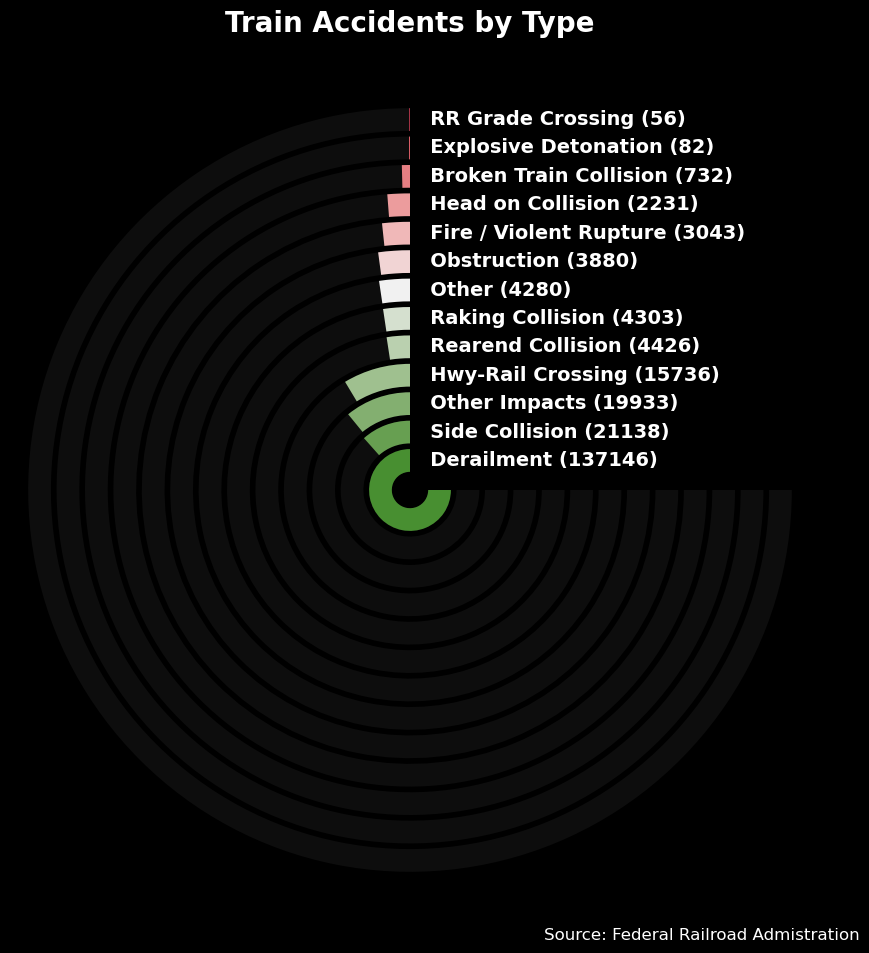

In [43]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Calculating the percentage of accidents
accident_counts = df['TYPE'].value_counts()

# create dataframe 
accident_counts_df = pd.DataFrame(accident_counts)

# rename columns as type and count
accident_counts_df = accident_counts_df.rename(columns={"TYPE": "count"})

# reset index
accident_counts_df = accident_counts_df.reset_index()

## sort 
accident_counts_df = accident_counts_df.sort_values(by=['count'], ascending=False)

max_value_full_ring = max(accident_counts_df['count'])
data_len = len(accident_counts_df)

ring_colours = ['#488f31', '#679f51', '#83af70', '#9fc08f', '#bad0af', '#d5e0cf', '#f1f1f1', 
                '#f1d4d4', '#f0b8b8', '#ec9c9d', '#e67f83', '#de6069', '#de425b']

ring_labels =  [f'   {x} ({v}) ' for x, v in zip(list(accident_counts_df['index']), 
                                                 list(accident_counts_df['count']))]


fig = plt.figure(figsize=(10,10), linewidth=10,
                 edgecolor='#000000', 
                 facecolor='#000000')

rect = [0.1,0.1,0.8,0.8]

# Add axis for radial backgrounds
ax_polar_bg = fig.add_axes(rect, polar=True, frameon=False)
# Start bars at top of plot
ax_polar_bg.set_theta_zero_location('N')
# Make bars go counter-clockwise. 
ax_polar_bg.set_theta_direction(1)

# Loop through each entry in the dataframe and plot a grey
# ring to create the background for each one
for i in range(data_len):
    ax_polar_bg.barh(i, max_value_full_ring*1.5*np.pi/max_value_full_ring, 
                     color='grey', 
                     alpha=0.1)
    
max_value_full_ring*1.5*np.pi/max_value_full_ring

# Hide all axis items
ax_polar_bg.axis('off')

# Add axis for radial chart for each entry in the dataframe
ax_polar = fig.add_axes(rect, polar=True, frameon=False)
ax_polar.set_theta_zero_location('N')
ax_polar.set_theta_direction(1)
ax_polar.set_rgrids([0, 1, 2, 3, 4, 5, 6,7,8,9,10,11,12], 
                    labels=ring_labels, 
                    angle=0, 
                    fontsize=14, fontweight='bold',
                    color='white', verticalalignment='center')

# Loop through each entry in the dataframe and create a coloured 
# ring for each entry
for i in range(data_len):
    ax_polar.barh(i, list(accident_counts_df['count'])[i]*1.5*np.pi/max_value_full_ring, 
                  color=ring_colours[i])
    
# Hide all grid elements for the    
ax_polar.grid(False)
ax_polar.tick_params(axis='both', left=False, bottom=False, 
                   labelbottom=False, labelleft=True)
plt.suptitle('Train Accidents by Type', fontsize=20, fontweight='bold', color='white')
plt.figtext(0.95, 0.05, 'Source: Federal Railroad Admistration', fontsize=12, color='white', ha='right')

plt.show()

# save image as png 
fig.savefig("../img/Histogram/png/Train_Accidents_by_Type_radar.png", facecolor=fig.get_facecolor(), edgecolor='none')

In [44]:
fig = px.histogram(df, x="WEATHER", title="Number of Train Accidents by Weather Condition <br><sup>Source: Federal Railroad Admistration</sup>",
                   color_discrete_sequence = ['#ABC4AA'])

# Update the layout
fig.update_layout(
    xaxis_title="Weather Condition",
    yaxis_title='Number of Accident',
    showlegend=False,
)
fig.show()

# save image as png
fig.write_image("../img/histogram/png/Number_of_Train_Accidents_by_Weather_Condition.png")
# save html
pio.write_html(fig, file='../img/histogram/html/Number_of_Train_Accidents_by_Weather_Condition.html', auto_open=False)

In [45]:
# INITIALIZE GRAPH OBJECT
fig = go.Figure()

# TRACE-1: histogram of train accidents
trace1 = go.Histogram(
    x=df['TYPEQ'],
    name='Type of Train',
    marker_color='green'
)

# TRACE-2: histogram of track accidents
trace2 = go.Histogram(
    x=df['TYPTRK'],
    name='Type of Track',
    marker_color='#66CDAA'
)

# ADDING TRACE TO FIGURE
fig.add_trace(trace1)
fig.add_trace(trace2)

# Add dropdown
fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="Type of Train",
                        method="update",
                        args=[{"visible": [True, False]},
                            {"title": "Train Accidents by Type of Train <br><sup>Source: Federal Railroad Admistration</sup>"}]),
                dict(label="Type of Track",
                        method="update",
                        args=[{"visible": [False, True]},
                            {"title": "Train Accidents by Type of Track <br><sup>Source: Federal Railroad Admistration</sup>"}])
            ]),
            direction="down",
            showactive=True,
            x=0.00,
            y=1.6
        )
    ]
)

# UPDATE LAYOUT
fig.update_layout(
    title_text='Number of Train Accidents by Type of Train <br><sup>Source: Federal Railroad Admistration</sup>',
    xaxis_title_text='Type of Train',
    yaxis_title_text='Number of Accidents',
    barmode='overlay',
    bargap=0.2,
    bargroupgap=0.1
)



# Show the figure
fig.show()

# save image as png
fig.write_image("../img/histogram/png/Number_of_Train_Accidents_by_Type_of_Train.png")
# save html
pio.write_html(fig, file='../img/histogram/html/Number_of_Train_Accidents_by_Type_of_Train.html', auto_open=False)

In [46]:
# Read the data
df = pd.read_csv("../data/airplanes_final.csv")
df.head()

,Date,Location,Operator,Type,Aboard,Fatalities,Ground,Summary,City,State
0,1908-09-17,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2.0,1.0,0.0,"During a demonstration flight, a U.S. Army fly...",Fort Myer,VA
1,1912-07-12,"AtlantiCity, New Jersey",Military - U.S. Navy,Dirigible,5.0,5.0,0.0,First U.S. dirigible Akron exploded just offsh...,AtlantiCity,NJ
2,1918-12-16,"Elizabeth, New Jersey",US Aerial Mail Service,De Havilland DH-4,1.0,1.0,0.0,NaN,Elizabeth,NJ
3,1919-05-25,"Cleveland, Ohio",US Aerial Mail Service,De Havilland DH-4,1.0,1.0,0.0,Caught fire in midair. The pilot leaped from t...,Cleveland,OH
4,1919-07-19,"Dix Run, Pennsylvania",US Aerial Mail Service,De Havilland DH-4,1.0,1.0,0.0,NaN,Dix Run,PA


In [47]:
# extract year from DATE column
df['Year'] = pd.to_datetime(df['Date']).dt.year

# create a histogram of the number of crashes per year
fig = px.histogram(df, x='Year',color_discrete_sequence = ['#7CB9E8'])

# customize the plot
fig.update_layout(
    title='Number of Flight Crashes by Year<br><sup>Source: Kaggle</sup>',
    xaxis_title='Year',
    yaxis_title='Number of Flight Crashes'
)

# display the plot
fig.show()

# save image as png
fig.write_image("../img/histogram/png/Number_of_Flight_Crashes_by_Year.png")
# save html
pio.write_html(fig, file='../img/histogram/html/Number_of_Flight_Crashes_by_Year.html', auto_open=False)

In [48]:
import altair as alt
import pandas as pd
import altair_saver

# create a dictionary mapping state to region
state_to_region = {'AL': 'South', 'AK': 'West', 'AZ': 'West', 'AR': 'South', 'CA': 'West', 'CO': 'West', 
                   'CT': 'Northeast', 'DE': 'South', 'FL': 'South', 'GA': 'South', 'HI': 'West', 'ID': 'West', 
                   'IL': 'Midwest', 'IN': 'Midwest', 'IA': 'Midwest', 'KS': 'Midwest', 'KY': 'South', 
                   'LA': 'South', 'ME': 'Northeast', 'MD': 'South', 'MA': 'Northeast', 'MI': 'Midwest', 
                   'MN': 'Midwest', 'MS': 'South', 'MO': 'Midwest', 'MT': 'West', 'NE': 'Midwest', 
                   'NV': 'West', 'NH': 'Northeast', 'NJ': 'Northeast', 'NM': 'West', 'NY': 'Northeast', 
                   'NC': 'South', 'ND': 'Midwest', 'OH': 'Midwest', 'OK': 'South', 'OR': 'West', 'PA': 'Northeast', 
                   'RI': 'Northeast', 'SC': 'South', 'SD': 'Midwest', 'TN': 'South', 'TX': 'South', 'UT': 'West', 
                   'VT': 'Northeast', 'VA': 'South', 'WA': 'West', 'WV': 'South', 'WI': 'Midwest', 'WY': 'West'}


# add a new column 'region' based on the state column
df['region'] = df['State'].map(state_to_region)

# extract the decades from the date column
df['decade'] = (pd.DatetimeIndex(df['Date']).year // 10) * 10

# group the data by decade and region
grouped = df.groupby(['decade', 'region']).size().reset_index(name='count')

# create the stacked bar plot
chart = alt.Chart(grouped).mark_bar().encode(
    x=alt.X('decade:O', axis=alt.Axis(title='Decade')),
    y=alt.Y('count:Q', axis=alt.Axis(title='Number of Accidents')),
    color=alt.Color('region:N', legend=alt.Legend(title='Region'), scale=alt.Scale(
        domain=['Midwest', 'Northeast', 'South', 'West'],
        range=['#57C5B6', '#159895', '#1A5F7A', '#002B5B']
    )),
    order=alt.Order('region', sort='ascending'),
    tooltip=[alt.Tooltip('count:Q', title='Number of Accidents')]
).properties(
    title={
        'text': 'Aircraft Accidents in the US',
        'subtitle': 'Source: Kaggle'
    },
    height=500,
    width=600
).configure_axis(
    labelFontSize=12,
    titleFontSize=14,
    titlePadding=15
).configure_title(
    fontSize=18,
    anchor='middle',
    subtitleFontWeight='normal',
)


# save chart
chart.save('../img/histogram/html/Aircraft_Accidents_in_the_US_decade.html')

# save chart as png
#altair_saver.save(chart,'../img/histogram/png/Aircraft_Accidents_in_the_US_decade.png')

# display the chart
chart


alt.Chart(...)

In [49]:
# extract year from DATE column
df['Year'] = pd.to_datetime(df['Date']).dt.year

# Filter data for relevant columns and group by state and year
df_filtered = df[['State', 'Year']].groupby(['State', 'Year']).size().reset_index(name='Crashes')

# Create the figure
fig = px.histogram(df_filtered, x="State", y="Crashes", color="State", animation_frame="Year",
                   range_y=[0, df_filtered['Crashes'].max()], nbins=len(df_filtered['State'].unique()), color_discrete_sequence = ['#72A0C1'])
# Remove the legend
fig.update_layout(showlegend=False)



# Update the layout
fig.update_layout(
    title='Number of Flight Accidents by State for Each Year<br><sup>Source: Kaggle</sup>',
    xaxis_title='State',
    yaxis_title='Number of Accidents'
)

# Show the plot
fig.show()

# save image as png
fig.write_image("../img/histogram/png/Number_of_Flight_Accidents_by_State_for_Each_Year.png")
# save html
pio.write_html(fig, file='../img/histogram/html/Number_of_Flight_Accidents_by_State_for_Each_Year.html', auto_open=False)


In [50]:
# INITIALIZE GRAPH OBJECT
fig = go.Figure()

# Group the data by aircraft type and count the number of crashes
type_crashes = df.groupby('Operator').count()['Date'].reset_index(name='count')

# Sort the data by count in descending order
type_crashes = type_crashes.sort_values(by='count', ascending=False)

# Get the top 5 aircraft types with the most flight crashes
top_5_types = type_crashes.iloc[:5]

# TRACE-1: Top 5 histogram of Operators
fig.add_trace(go.Bar(x=top_5_types['Operator'], y=top_5_types['count'], name='Top 5 Aircraft Types', marker_color='#72A0C1'))

# Group the data by aircraft type and count the number of crashes
type_crashes = df.groupby('Type').count()['Date'].reset_index(name='count')

# Sort the data by count in descending order
type_crashes = type_crashes.sort_values(by='count', ascending=False)

# Get the top 5 aircraft types with the most flight crashes
top_5_types = type_crashes.iloc[:5]

# TRACE-2: Top 5 AIRCARFTS
fig.add_trace(go.Bar(x=top_5_types['Type'], y=top_5_types['count'], name='Top 5 Aircrafts', marker_color="#13274F"))


# Add dropdown
fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="Top 5 Operators",
                        method="update",    
                        args=[{"visible": [True, False]},
                            {"title": "Top 5 Operators with the Most Flight Crashes<br><sup>Source: Kaggle</sup>"}]),
                dict(label="Top 5 Aircrafts",
                        method="update",
                        args=[{"visible": [False, True]},
                            {"title": "Top 5 Aircrafts with the Most Flight Crashe<br><sup>Source: Kaggle</sup>s"}])
            ]),
        )
    ]
)

# Update the layout
fig.update_layout(
    title='Top 5 Operators with the Most Flight Crashes<br><sup>Source: Kaggle</sup>',
    xaxis_title='Operator',
    yaxis_title='Number of Crashes'
)

# Show the plot
fig.show()

# save image as png
fig.write_image("../img/histogram/png/Top_5_Operators_with_the_Most_Flight_Crashes.png")
# save html
pio.write_html(fig, file='../img/histogram/html/Top_5_Operators_with_the_Most_Flight_Crashes.html', auto_open=False)


In [51]:
# Create a histogram of fatalities
fig = go.Figure(data=[go.Histogram(x=df['Fatalities'], nbinsx=20, marker_color = '#6495ED')])
fig.update_layout(title="Fatalities in Flight Crashes<br><sup>Source: Kaggle</sup>", xaxis_title="Number of Fatalities", yaxis_title="Count")

# Display the plot
fig.show()

# save image as png
fig.write_image("../img/histogram/png/Fatalities_in_Flight_Crashes.png")
# save html
pio.write_html(fig, file='../img/histogram/html/Fatalities_in_Flight_Crashes.html', auto_open=False)
